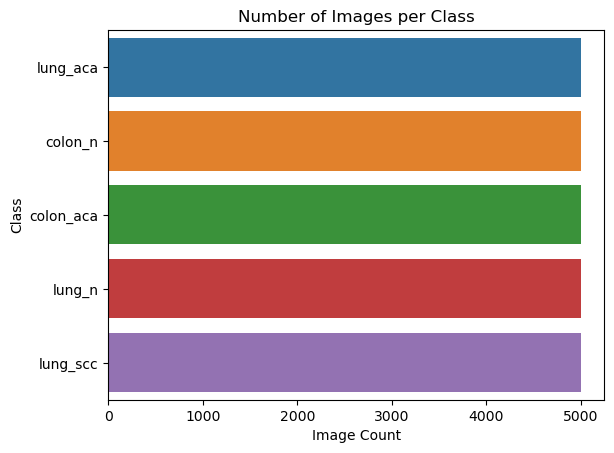

In [3]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

data_dir = '/Users/varshahindupur/Downloads/lung_colon_image_set'

# Correctly list the directories/classes in your dataset
classes = os.listdir(data_dir)
image_count = {}
for cls in classes:
    # You might need to add a condition to skip any non-directory files
    if os.path.isdir(os.path.join(data_dir, cls)):
        images = os.listdir(os.path.join(data_dir, cls))
        image_count[cls] = len(images)

# Convert to DataFrame for easy visualization
image_count_df = pd.DataFrame(list(image_count.items()), columns=['Class', 'Image Count'])

# Plotting
sns.barplot(x='Image Count', y='Class', data=image_count_df)
plt.title('Number of Images per Class')
plt.show()

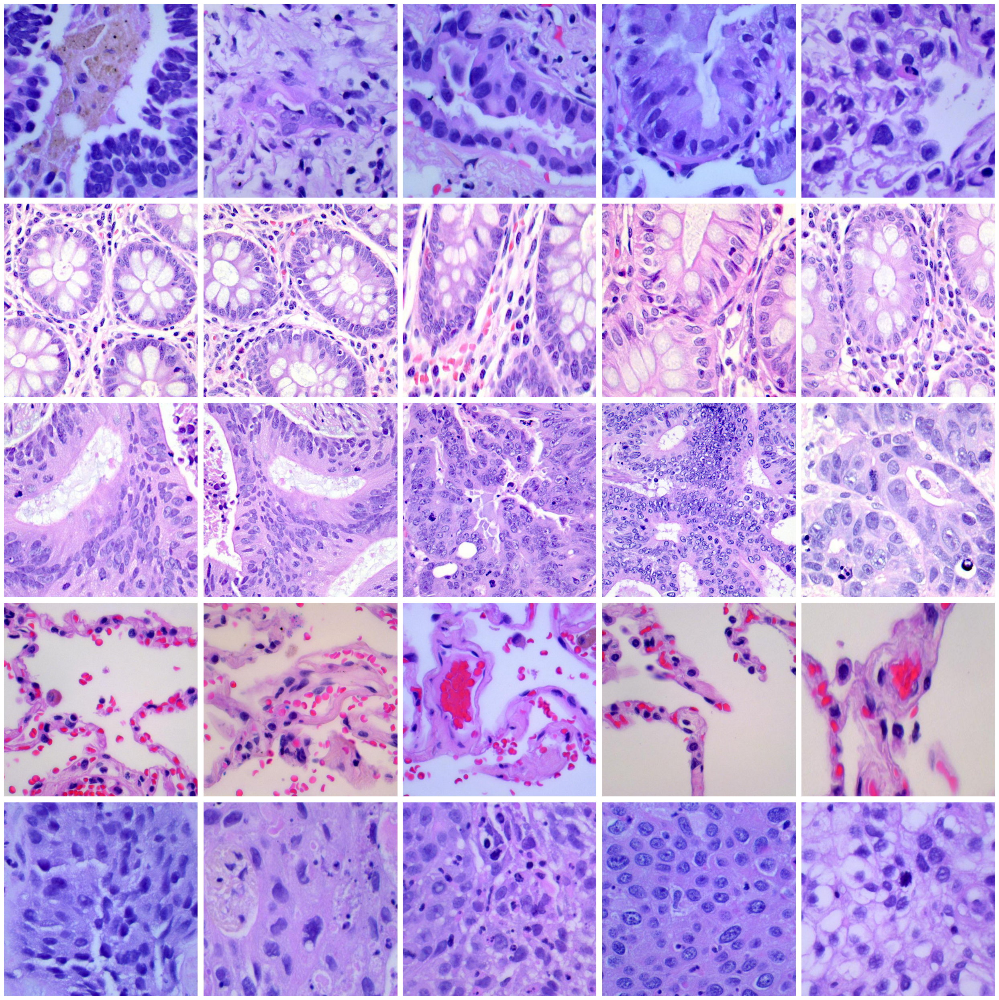

In [8]:
import os
from PIL import Image
import matplotlib.pyplot as plt

def plot_sample_images(data_dir, samples_per_class=5):
    # Fetch all class directories, ignoring files like .DS_Store
    classes = [d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))]
    
    fig, axes = plt.subplots(len(classes), samples_per_class, figsize=(5*samples_per_class, 5*len(classes)))
    if len(classes) == 1:  # If there's only one class, axes array is 1D
        axes = [axes]
    
    for i, cls in enumerate(classes):
        class_dir = os.path.join(data_dir, cls)
        images = [img for img in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, img))]
        images = images[:samples_per_class]  # Get first N samples
        for j, img_name in enumerate(images):
            img_path = os.path.join(data_dir, cls, img_name)
            img = Image.open(img_path)
            axes[i][j].imshow(img)
            axes[i][j].axis('off')
            if j == 0:
                axes[i][j].set_ylabel(cls, size='large')
    
    plt.tight_layout()
    plt.show()

# Assuming 'data_dir' is defined and points to your dataset directory
plot_sample_images(data_dir)

In [9]:
import os
from PIL import Image

data_dir = '/Users/varshahindupur/Downloads/lung_colon_image_set'

# Fetch only directories, excluding files like .DS_Store
classes = [d for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))]

image_dimensions = {'Width': [], 'Height': []}
for cls in classes:
    class_dir = os.path.join(data_dir, cls)
    images = [img for img in os.listdir(class_dir) if os.path.isfile(os.path.join(class_dir, img))]
    for img_name in images:
        img_path = os.path.join(class_dir, img_name)
        with Image.open(img_path) as img:
            width, height = img.size
            image_dimensions['Width'].append(width)
            image_dimensions['Height'].append(height)

# At this point, 'image_dimensions' dict contains the dimensions of all images in your dataset

In [10]:
df_dimensions = pd.DataFrame(image_dimensions)

In [11]:
plt.figure(figsize=(12, 6))

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

Text(0.5, 1.0, 'Image Width Distribution')

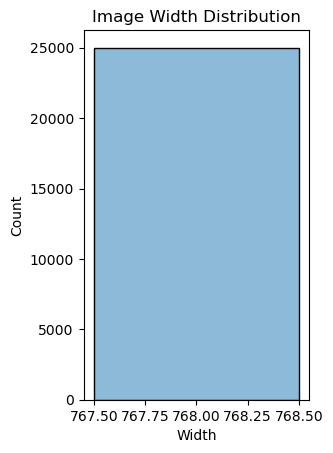

In [12]:
plt.subplot(1, 2, 1)
sns.histplot(df_dimensions['Width'], kde=True)
plt.title('Image Width Distribution')

Text(0.5, 1.0, 'Image Height Distribution')

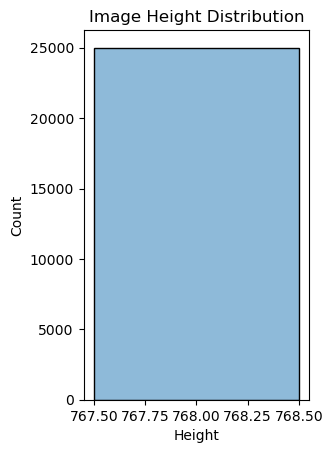

In [13]:
# Height distribution
plt.subplot(1, 2, 2)
sns.histplot(df_dimensions['Height'], kde=True)
plt.title('Image Height Distribution')

In [14]:
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>